In [1]:
#Importing Libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
import itertools

In [3]:
application_data = pd.read_csv('application_data.csv')
previous_application = pd.read_csv('previous_application.csv')
columns_description = pd.read_csv('columns_description.csv',skiprows=1)

In [4]:
pd.set_option('display.max_rows',None,'display.max_columns',None)

In [5]:
application_data.shape

(307511, 122)

In [6]:
previous_application.shape

(1670214, 37)

In [7]:
columns_description.shape

(159, 5)


## Percentage of Missing data in previous_application

In [8]:
previous_application.isnull().sum().sort_values()/len(previous_application)*100

SK_ID_PREV                      0.000000
NAME_YIELD_GROUP                0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
NAME_PORTFOLIO                  0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE                0.000000
CODE_REJECT_REASON              0.000000
DAYS_DECISION                   0.000000
NAME_CONTRACT_STATUS            0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_PAYMENT_TYPE               0.000000
AMT_APPLICATION                 0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
NAME_CONTRACT_TYPE              0.000000
SK_ID_CURR                      0.000000
AMT_CREDIT                      0.000060
PRODUCT_COMBINATION             0.020716
CNT_PAYMENT                    22.286366
AMT_ANNUITY     

In [9]:
#Removing columns with more than 50% null values
previous_application_1=previous_application.drop(['AMT_DOWN_PAYMENT','RATE_DOWN_PAYMENT','RATE_INTEREST_PRIMARY','RATE_INTEREST_PRIVILEGED'],axis=1)

In [10]:
previous_application_1.isnull().sum().sort_values()/len(previous_application)*100

SK_ID_PREV                      0.000000
NAME_YIELD_GROUP                0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
NAME_PORTFOLIO                  0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE                0.000000
CODE_REJECT_REASON              0.000000
NAME_PAYMENT_TYPE               0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
AMT_APPLICATION                 0.000000
NAME_CONTRACT_TYPE              0.000000
SK_ID_CURR                      0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
AMT_CREDIT                      0.000060
PRODUCT_COMBINATION             0.020716
CNT_PAYMENT                    22.286366
AMT_ANNUITY     

In [11]:
previous_application_1['AMT_ANNUITY'].isnull().sum()

372235

In [12]:
# Hanmdling the remaining missing values column by column
previous_application_1['AMT_ANNUITY'].describe()

count    1.297979e+06
mean     1.595512e+04
std      1.478214e+04
min      0.000000e+00
25%      6.321780e+03
50%      1.125000e+04
75%      2.065842e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64

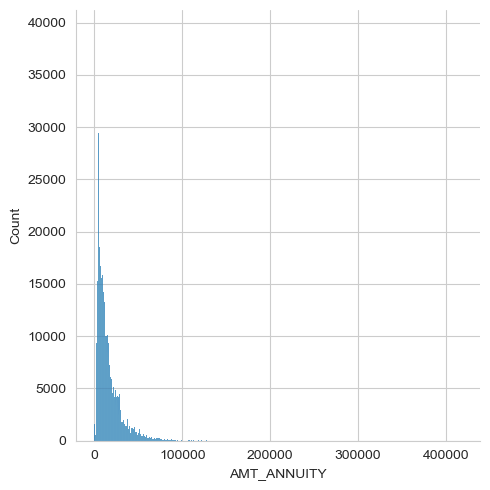

In [13]:
sns.set_style('whitegrid')
sns.displot(previous_application_1['AMT_ANNUITY'])
plt.show()

In [14]:
previous_application_1['AMT_ANNUITY'].mean()

15955.120659452119

In [15]:
#We can Fill NA with 15955 i.e. Mean for this field
previous_application_1['AMT_ANNUITY']=previous_application_1['AMT_ANNUITY'].fillna(previous_application_1['AMT_ANNUITY'].mean())

In [16]:
previous_application_1['AMT_ANNUITY'].value_counts(normalize=True)

15955.120659     2.228667e-01
2250.000000      1.907839e-02
11250.000000     8.366593e-03
6750.000000      8.048070e-03
9000.000000      7.481676e-03
22500.000000     7.126632e-03
4500.000000      6.344696e-03
13500.000000     4.293462e-03
3375.000000      2.877476e-03
7875.000000      2.798444e-03
38250.000000     2.472138e-03
5625.000000      2.390712e-03
45000.000000     2.157807e-03
10125.000000     1.531540e-03
16875.000000     1.458496e-03
18000.000000     1.114228e-03
29250.000000     9.950821e-04
0.000000         9.801139e-04
12375.000000     9.783177e-04
20250.000000     9.705343e-04
33750.000000     8.454006e-04
15750.000000     8.202542e-04
27000.000000     6.436301e-04
14625.000000     5.172990e-04
10492.020000     5.035283e-04
36000.000000     4.885601e-04
27449.820000     4.376685e-04
21709.125000     4.358723e-04
5246.010000      3.981526e-04
7869.015000      3.909679e-04
19151.100000     3.825857e-04
25996.365000     3.400762e-04
14746.455000     3.376813e-04
19125.0000

In [17]:
previous_application_1['NAME_TYPE_SUITE'].isnull().sum()

820405

In [18]:
previous_application_1['NAME_TYPE_SUITE'].describe()

count            849809
unique                7
top       Unaccompanied
freq             508970
Name: NAME_TYPE_SUITE, dtype: object

In [19]:
previous_application_1['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      508970
Family             213263
Spouse, partner     67069
Children            31566
Other_B             17624
Other_A              9077
Group of people      2240
Name: NAME_TYPE_SUITE, dtype: int64

In [20]:
#Filling NA with mode ie Unaccompanied 

In [21]:
previous_application_1['NAME_TYPE_SUITE']=previous_application_1['NAME_TYPE_SUITE'].fillna('Unaccompanied')

In [22]:
previous_application_1['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      1329375
Family              213263
Spouse, partner      67069
Children             31566
Other_B              17624
Other_A               9077
Group of people       2240
Name: NAME_TYPE_SUITE, dtype: int64

In [23]:
previous_application_1['CNT_PAYMENT'].isnull().sum()

372230

In [24]:
previous_application_1['CNT_PAYMENT'].describe()

count    1.297984e+06
mean     1.605408e+01
std      1.456729e+01
min      0.000000e+00
25%      6.000000e+00
50%      1.200000e+01
75%      2.400000e+01
max      8.400000e+01
Name: CNT_PAYMENT, dtype: float64

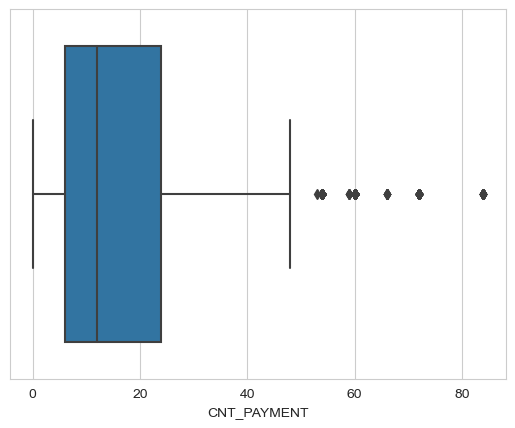

In [25]:
sns.set_style('whitegrid')
sns.boxplot(x=previous_application_1['CNT_PAYMENT'])
plt.show()

In [26]:
previous_application_1['CNT_PAYMENT']=previous_application_1['CNT_PAYMENT'].fillna(previous_application_1['CNT_PAYMENT'].median())

In [27]:
previous_application_1['CNT_PAYMENT'].value_counts()

12.0    695279
6.0     190461
0.0     144985
10.0    141851
24.0    137764
18.0     77430
36.0     72583
60.0     53600
48.0     47316
8.0      30349
4.0      26924
30.0     16924
14.0      8253
42.0      7136
16.0      5710
5.0       3957
54.0      2104
20.0      1805
7.0       1434
9.0       1236
3.0       1100
15.0       904
11.0       669
72.0       139
13.0        51
17.0        48
84.0        45
22.0        37
23.0        27
26.0        13
35.0        11
66.0        10
28.0         8
29.0         8
32.0         6
19.0         6
34.0         4
59.0         4
41.0         3
47.0         3
45.0         3
21.0         3
44.0         2
39.0         2
46.0         2
38.0         2
33.0         1
40.0         1
53.0         1
Name: CNT_PAYMENT, dtype: int64

In [28]:
previous_application_1['DAYS_FIRST_DRAWING'].describe()

count    997149.000000
mean     342209.855039
std       88916.115834
min       -2922.000000
25%      365243.000000
50%      365243.000000
75%      365243.000000
max      365243.000000
Name: DAYS_FIRST_DRAWING, dtype: float64

In [29]:
previous_application_1['DAYS_FIRST_DRAWING'].isnull().sum()

673065

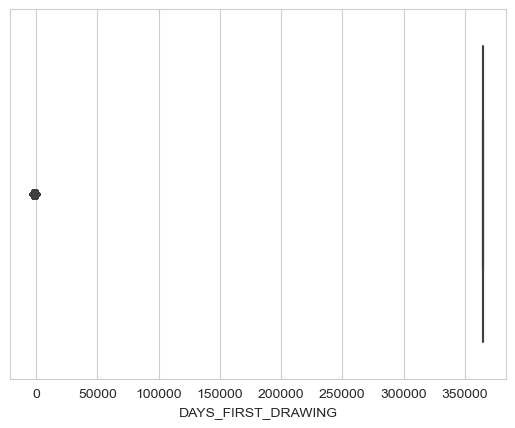

In [30]:
sns.set_style('whitegrid')
sns.boxplot(x=previous_application_1['DAYS_FIRST_DRAWING'])
plt.show()

In [31]:
previous_application_1['DAYS_FIRST_DRAWING']=previous_application_1['DAYS_FIRST_DRAWING'].fillna(previous_application_1['DAYS_FIRST_DRAWING'].median())

In [32]:
previous_application_1['DAYS_FIRST_DRAWING'].value_counts()

 365243.0    1607509
-228.0           123
-224.0           121
-212.0           121
-223.0           119
-220.0           118
-210.0           117
-235.0           117
-240.0           116
-226.0           115
-227.0           115
-244.0           114
-217.0           112
-239.0           111
-255.0           110
-249.0           109
-197.0           109
-241.0           108
-202.0           108
-196.0           108
-237.0           108
-263.0           108
-266.0           107
-238.0           107
-256.0           106
-215.0           106
-230.0           106
-259.0           106
-252.0           106
-280.0           105
-209.0           105
-284.0           105
-222.0           105
-201.0           104
-243.0           102
-250.0           102
-192.0           102
-211.0           102
-245.0           101
-214.0           101
-200.0           101
-194.0           101
-204.0           100
-291.0           100
-189.0            99
-276.0            99
-251.0            99
-270.0       

In [33]:
previous_application_1['DAYS_FIRST_DUE'].isnull().sum()

673065

In [34]:
previous_application_1['DAYS_FIRST_DUE'].describe()

count    997149.000000
mean      13826.269337
std       72444.869708
min       -2892.000000
25%       -1628.000000
50%        -831.000000
75%        -411.000000
max      365243.000000
Name: DAYS_FIRST_DUE, dtype: float64

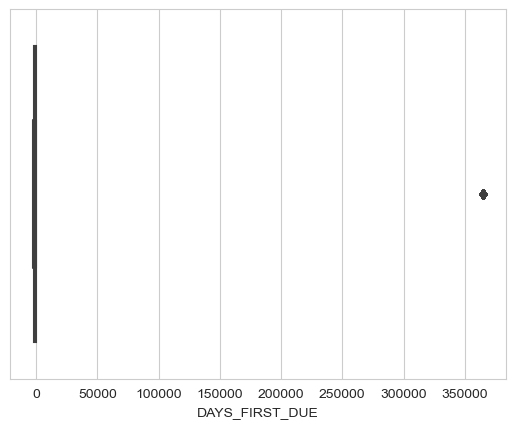

In [35]:
sns.set_style('whitegrid')
sns.boxplot(x=previous_application_1['DAYS_FIRST_DUE'])
plt.show()

In [36]:
previous_application_1['DAYS_FIRST_DUE']=previous_application_1['DAYS_FIRST_DUE'].fillna(previous_application_1['DAYS_FIRST_DUE'].median())

In [37]:
previous_application_1['DAYS_FIRST_DUE'].value_counts()

-831.0       673613
 365243.0     40645
-334.0          772
-509.0          760
-208.0          751
-330.0          750
-292.0          746
-691.0          745
-270.0          744
-299.0          744
-327.0          743
-320.0          741
-264.0          738
-313.0          737
-328.0          733
-698.0          731
-488.0          730
-271.0          730
-508.0          729
-298.0          726
-329.0          724
-322.0          715
-333.0          714
-325.0          708
-326.0          707
-361.0          706
-418.0          705
-265.0          705
-257.0          703
-324.0          703
-242.0          701
-240.0          697
-516.0          696
-390.0          695
-342.0          694
-600.0          690
-335.0          690
-243.0          689
-453.0          688
-337.0          685
-209.0          685
-340.0          683
-482.0          683
-478.0          682
-201.0          682
-300.0          681
-384.0          680
-670.0          680
-331.0          679
-383.0          679


In [38]:
previous_application_1['DAYS_LAST_DUE'].isnull().sum()

673065

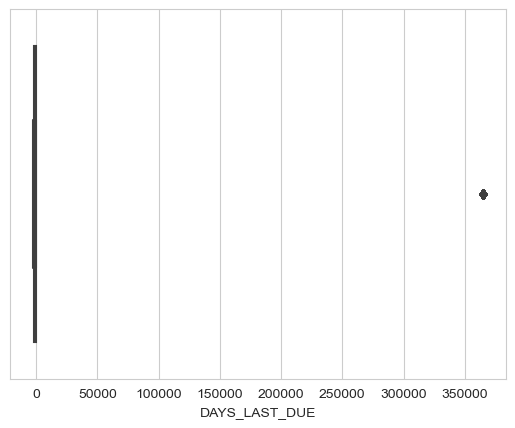

In [39]:
sns.set_style('whitegrid')
sns.boxplot(x=previous_application_1['DAYS_LAST_DUE'])
plt.show()

In [40]:
previous_application_1['DAYS_LAST_DUE']=previous_application_1['DAYS_LAST_DUE'].fillna(previous_application_1['DAYS_LAST_DUE'].median())

In [41]:
previous_application_1['DAYS_TERMINATION'].isnull().sum()

673065

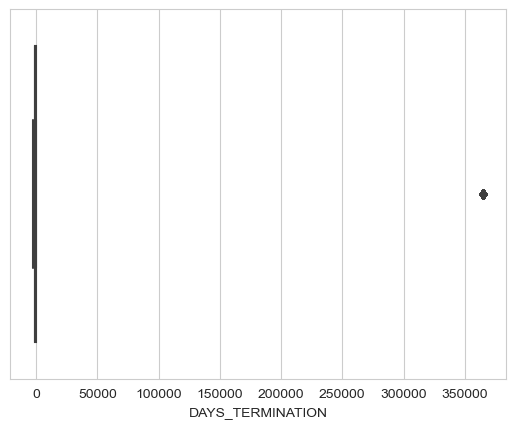

In [42]:
# sns.set_style('whitegrid')
sns.boxplot(x=previous_application_1['DAYS_TERMINATION'])
plt.show()

In [43]:
previous_application_1['DAYS_TERMINATION']=previous_application_1['DAYS_TERMINATION'].fillna(previous_application_1['DAYS_TERMINATION'].median())

In [44]:
previous_application_1['NFLAG_INSURED_ON_APPROVAL'].isnull().sum()

673065

In [45]:
previous_application_1['NFLAG_INSURED_ON_APPROVAL']=previous_application_1['NFLAG_INSURED_ON_APPROVAL'].fillna(previous_application_1['NFLAG_INSURED_ON_APPROVAL'].mode())

In [46]:
previous_application_1.isnull().sum()

SK_ID_PREV                          0
SK_ID_CURR                          0
NAME_CONTRACT_TYPE                  0
AMT_ANNUITY                         0
AMT_APPLICATION                     0
AMT_CREDIT                          1
AMT_GOODS_PRICE                385515
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
FLAG_LAST_APPL_PER_CONTRACT         0
NFLAG_LAST_APPL_IN_DAY              0
NAME_CASH_LOAN_PURPOSE              0
NAME_CONTRACT_STATUS                0
DAYS_DECISION                       0
NAME_PAYMENT_TYPE                   0
CODE_REJECT_REASON                  0
NAME_TYPE_SUITE                     0
NAME_CLIENT_TYPE                    0
NAME_GOODS_CATEGORY                 0
NAME_PORTFOLIO                      0
NAME_PRODUCT_TYPE                   0
CHANNEL_TYPE                        0
SELLERPLACE_AREA                    0
NAME_SELLER_INDUSTRY                0
CNT_PAYMENT                         0
NAME_YIELD_GROUP                    0
PRODUCT_COMB

In [47]:
previous_application_1['AMT_CREDIT']=previous_application_1['AMT_CREDIT'].fillna(previous_application_1['AMT_CREDIT'].median())

In [48]:
previous_application_1['PRODUCT_COMBINATION']=previous_application_1['PRODUCT_COMBINATION'].fillna('Cash')

In [49]:
previous_application_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 33 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1670214 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670214 non-null  float64
 6   AMT_GOODS_PRICE              1284699 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 8   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 11  NAME_CASH_LOAN_PURPOSE       1670214 non-null  object 
 12  NAME_CONTRACT_STATUS         1670214 non-n

In [50]:
obj_dtypes = [i for i in previous_application_1.select_dtypes(include=object).columns if i not in ["type"]]

In [51]:
obj_dtypes

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

In [52]:
previous_application_1.select_dtypes(include=object).columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [53]:
num_dtype=[i for i in previous_application_1.select_dtypes(include=np.number).columns if i not in ['SK_ID_CURR'] + [ 'TARGET']]

In [54]:
num_dtype

['SK_ID_PREV',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

## Percentage of Missing data in application_data

In [55]:
application_data.isnull().sum().sort_values()/len(application_data)*100

SK_ID_CURR                       0.000000
HOUR_APPR_PROCESS_START          0.000000
REG_REGION_NOT_WORK_REGION       0.000000
LIVE_REGION_NOT_WORK_REGION      0.000000
REG_CITY_NOT_LIVE_CITY           0.000000
REG_CITY_NOT_WORK_CITY           0.000000
LIVE_CITY_NOT_WORK_CITY          0.000000
ORGANIZATION_TYPE                0.000000
FLAG_DOCUMENT_21                 0.000000
FLAG_DOCUMENT_20                 0.000000
FLAG_DOCUMENT_19                 0.000000
FLAG_DOCUMENT_18                 0.000000
FLAG_DOCUMENT_17                 0.000000
FLAG_DOCUMENT_16                 0.000000
FLAG_DOCUMENT_15                 0.000000
FLAG_DOCUMENT_14                 0.000000
FLAG_DOCUMENT_13                 0.000000
FLAG_DOCUMENT_12                 0.000000
FLAG_DOCUMENT_11                 0.000000
FLAG_DOCUMENT_10                 0.000000
FLAG_DOCUMENT_9                  0.000000
FLAG_DOCUMENT_8                  0.000000
FLAG_DOCUMENT_7                  0.000000
FLAG_DOCUMENT_6                  0

In [56]:
application_data_1=application_data.drop(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG',
       'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE',
       'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE',
       'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE',
       'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI',
       'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI',
       'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI',
       'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'TOTALAREA_MODE',
       'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE',"OWN_CAR_AGE","OCCUPATION_TYPE"],axis=1)

In [57]:
application_data_1.shape

(307511, 70)

In [58]:
application_data_1.isnull().sum().sort_values()/len(application_data_1)*100

SK_ID_CURR                      0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
REG_REGION_NOT_WORK_REGION      0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
REG_CITY_NOT_WORK_CITY          0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
ORGANIZATION_TYPE               0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3                 0.000000
FLAG_DOCUMENT_4                 0.000000
FLAG_DOCUMENT_5                 0.000000
FLAG_DOCUMENT_6                 0.000000
FLAG_DOCUMENT_7                 0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_DOCUMENT_8                 0.000000
FLAG_DOCUMENT_10                0.000000
FLAG_DOCUMENT_11                0.000000
FLAG_DOCUMENT_12                0.000000
FLAG_DOCUMENT_13                0.000000
FLAG_DOCUMENT_14                0.000000
FLAG_DOCUMENT_15                0.000000
FLAG_DOCUMENT_16                0.000000
FLAG_DOCUMENT_17                0.000000
FLAG_DOCUMENT_18                0.000000
FLAG_DOCUMENT_19

In [59]:
application_data_1['AMT_REQ_CREDIT_BUREAU_DAY']=application_data_1['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_data_1['AMT_REQ_CREDIT_BUREAU_DAY'].median())

In [60]:
application_data_1['AMT_REQ_CREDIT_BUREAU_DAY'].median()
application_data_1['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts()

0.0    306022
1.0      1292
2.0       106
3.0        45
4.0        26
5.0         9
6.0         8
9.0         2
8.0         1
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: int64

In [61]:
application_data_1['AMT_REQ_CREDIT_BUREAU_HOUR']=application_data_1['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_data_1['AMT_REQ_CREDIT_BUREAU_HOUR'].median())

In [62]:
application_data_1['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts()

0.0    305885
1.0      1560
2.0        56
3.0         9
4.0         1
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: int64

In [63]:
application_data_1['AMT_REQ_CREDIT_BUREAU_MON']=application_data_1['AMT_REQ_CREDIT_BUREAU_MON'].fillna(application_data_1['AMT_REQ_CREDIT_BUREAU_MON'].median())

In [64]:
application_data_1['AMT_REQ_CREDIT_BUREAU_MON'].value_counts()

0.0     263752
1.0      33147
2.0       5386
3.0       1991
4.0       1076
5.0        602
6.0        343
7.0        298
9.0        206
8.0        185
10.0       132
11.0       119
12.0        77
13.0        72
14.0        40
15.0        35
16.0        23
17.0        14
18.0         6
19.0         3
24.0         1
23.0         1
27.0         1
22.0         1
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: int64

In [65]:
application_data_1['AMT_REQ_CREDIT_BUREAU_WEEK']=application_data_1['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_data_1['AMT_REQ_CREDIT_BUREAU_WEEK'].median())

In [66]:
application_data_1['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts()

0.0    298975
1.0      8208
2.0       199
3.0        58
4.0        34
6.0        20
5.0        10
8.0         5
7.0         2
Name: AMT_REQ_CREDIT_BUREAU_WEEK, dtype: int64

In [67]:
application_data_1['AMT_REQ_CREDIT_BUREAU_YEAR']=application_data_1['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_data_1['AMT_REQ_CREDIT_BUREAU_YEAR'].median())

In [68]:
application_data_1['AMT_REQ_CREDIT_BUREAU_YEAR'].value_counts()

1.0     104924
0.0      71801
2.0      50192
3.0      33628
4.0      20714
5.0      12052
6.0       6967
7.0       3869
8.0       2127
9.0       1096
11.0        31
12.0        30
10.0        22
13.0        19
14.0        10
17.0         7
15.0         6
19.0         4
18.0         4
16.0         3
25.0         1
23.0         1
22.0         1
21.0         1
20.0         1
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: int64

In [69]:
application_data_1['DEF_30_CNT_SOCIAL_CIRCLE']=application_data_1['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(application_data_1['DEF_30_CNT_SOCIAL_CIRCLE'].median())

In [70]:
application_data_1['DEF_30_CNT_SOCIAL_CIRCLE'].value_counts()

0.0     272345
1.0      28328
2.0       5323
3.0       1192
4.0        253
5.0         56
6.0         11
7.0          1
34.0         1
8.0          1
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [71]:
application_data_1['OBS_60_CNT_SOCIAL_CIRCLE']=application_data_1['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(application_data_1['OBS_60_CNT_SOCIAL_CIRCLE'].median())

In [72]:
application_data_1['OBS_60_CNT_SOCIAL_CIRCLE'].value_counts()

0.0      165687
1.0       48870
2.0       29766
3.0       20215
4.0       13946
5.0        9463
6.0        6349
7.0        4344
8.0        2886
9.0        1959
10.0       1335
11.0        837
12.0        620
13.0        401
14.0        238
15.0        166
16.0        137
17.0         73
18.0         49
19.0         44
20.0         30
21.0         28
22.0         20
23.0         13
24.0         12
25.0         11
27.0          5
29.0          2
28.0          1
47.0          1
344.0         1
30.0          1
26.0          1
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [73]:
application_data_1['DEF_60_CNT_SOCIAL_CIRCLE']=application_data_1['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(application_data_1['DEF_60_CNT_SOCIAL_CIRCLE'].median())

In [74]:
application_data_1.isnull().sum().sort_values()

SK_ID_CURR                         0
REG_CITY_NOT_WORK_CITY             0
LIVE_CITY_NOT_WORK_CITY            0
ORGANIZATION_TYPE                  0
DEF_30_CNT_SOCIAL_CIRCLE           0
OBS_60_CNT_SOCIAL_CIRCLE           0
DEF_60_CNT_SOCIAL_CIRCLE           0
FLAG_DOCUMENT_2                    0
FLAG_DOCUMENT_3                    0
FLAG_DOCUMENT_4                    0
FLAG_DOCUMENT_5                    0
FLAG_DOCUMENT_6                    0
FLAG_DOCUMENT_7                    0
FLAG_DOCUMENT_8                    0
FLAG_DOCUMENT_9                    0
REG_CITY_NOT_LIVE_CITY             0
FLAG_DOCUMENT_10                   0
FLAG_DOCUMENT_12                   0
FLAG_DOCUMENT_13                   0
FLAG_DOCUMENT_14                   0
FLAG_DOCUMENT_15                   0
FLAG_DOCUMENT_16                   0
FLAG_DOCUMENT_17                   0
FLAG_DOCUMENT_18                   0
FLAG_DOCUMENT_19                   0
FLAG_DOCUMENT_20                   0
FLAG_DOCUMENT_21                   0
A

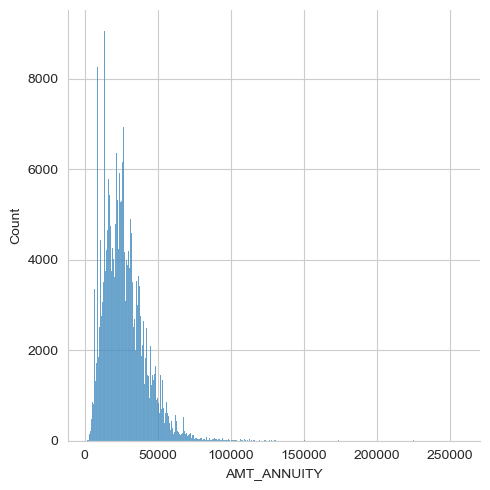

In [75]:
sns.set_style('whitegrid')
sns.displot(application_data_1['AMT_ANNUITY'])
plt.show()

In [76]:
application_data_1['AMT_ANNUITY']=application_data_1['AMT_ANNUITY'].fillna(application_data_1['AMT_ANNUITY'].mean())

In [77]:
application_data_1['AMT_GOODS_PRICE']=application_data_1['AMT_GOODS_PRICE'].fillna(application_data_1['AMT_GOODS_PRICE'].mean())

In [78]:
application_data_1['NAME_TYPE_SUITE']=application_data_1['NAME_TYPE_SUITE'].fillna('Unaccompanied')

In [79]:
application_data_1['CNT_FAM_MEMBERS']=application_data_1['CNT_FAM_MEMBERS'].fillna(application_data_1['CNT_FAM_MEMBERS'].median())

In [80]:
application_data_1['DAYS_LAST_PHONE_CHANGE']=application_data_1['DAYS_LAST_PHONE_CHANGE'].fillna(application_data_1['DAYS_LAST_PHONE_CHANGE'].mode())

In [81]:
application_data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 70 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

## Converting Negative values to absolute values 

In [82]:
# Checking for columns having negative values
application_data_1_intcol=list(application_data_1.select_dtypes(include=np.number).columns)
# negative_colmn=application_data_1.lt(0).any()
# negative_colmn_lst=negative_colmn[negative_colmn].index.tolist()
# print(negative_colmn_lst)

In [83]:
application_data_1_intcol

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG

In [84]:
application_data_1_intcoldf=pd.DataFrame(application_data_1[application_data_1_intcol])

In [85]:
application_data_1_intcoldf.columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10',

In [86]:
negative_colm=application_data_1_intcoldf.lt(0).any()
negative_colm=negative_colm[negative_colm].index.tolist()
print(negative_colm)

['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']


In [87]:
application_data_1['DAYS_BIRTH']=abs(application_data_1['DAYS_BIRTH'])
application_data_1['DAYS_ID_PUBLISH']=abs(application_data_1['DAYS_ID_PUBLISH'])
application_data_1['DAYS_LAST_PHONE_CHANGE']=abs(application_data_1['DAYS_LAST_PHONE_CHANGE'])


### Separating Numerical and categorical data

In [88]:
application_data_1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,-637,-3648.0,2120,1,1,0,1,1,0,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,-1188,-1186.0,291,1,1,0,1,1,0,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,-225,-4260.0,2531,1,1,1,1,1,0,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,-3039,-9833.0,2437,1,1,0,1,0,0,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,NaN,1.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,-3038,-4311.0,3458,1,1,0,1,0,0,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [89]:
app_obj_data=[i for i in application_data_1.select_dtypes(include=object) if i not in ['type']]
app_int_data=[i for i in application_data_1.select_dtypes(include=np.number)if i not in ['SK_ID_CURR'] + [ 'TARGET']]

In [90]:
app_obj_data

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

In [91]:
app_int_data

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCU

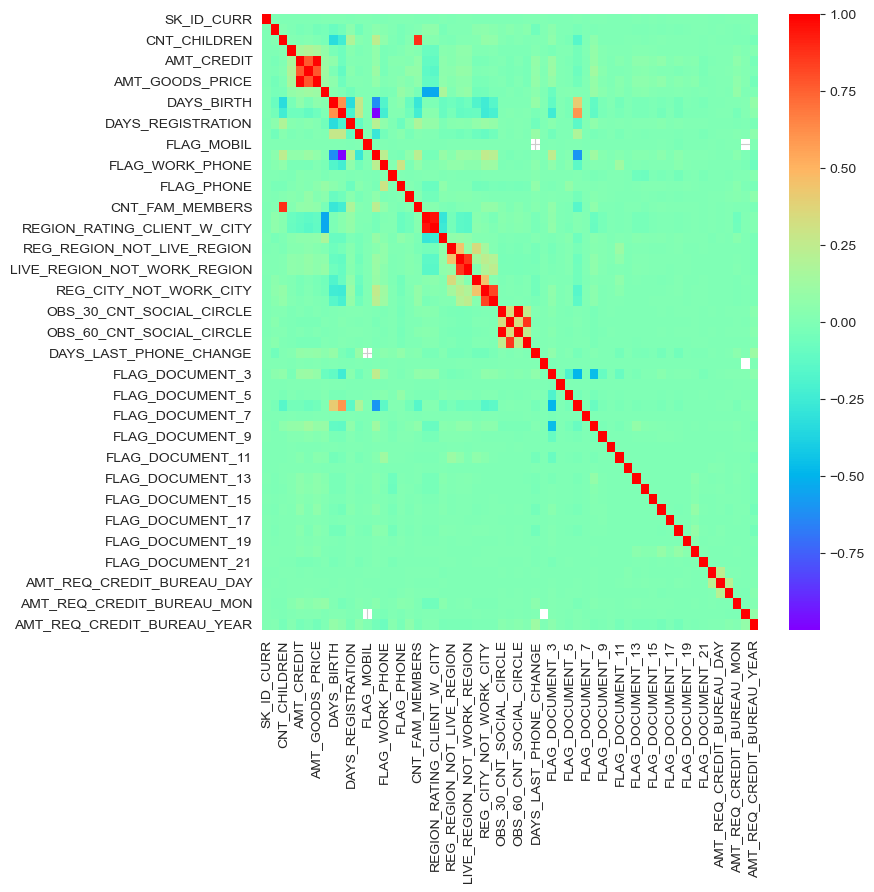

In [92]:
application_data_corr=application_data_1.corr()
f,ax=plt.subplots(figsize=(8,8))
sns.heatmap(application_data_corr, ax=ax ,cmap='rainbow')
plt.show()

## Previous application Correlation 

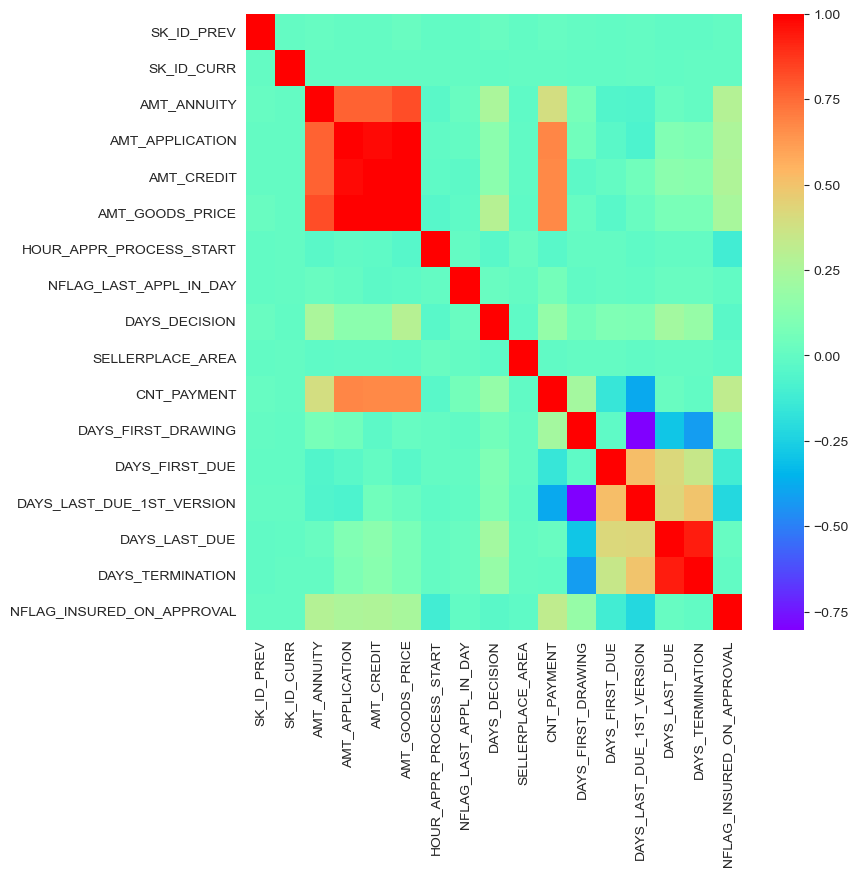

In [93]:
previous_application_1_corr=previous_application_1.corr()
f,ax=plt.subplots(figsize=(8,8))
sns.heatmap(previous_application_1_corr,ax=ax ,cmap='rainbow')
plt.show()

In [94]:
corrmat = previous_application.corr() #calculates the pairwise correlation between all 
# numeric variables in the previous_application DataFrame.

corrdf = corrmat.where(np.triu(np.ones(corrmat.shape), k=1).astype(bool)) #np.triu() generates a matrix of ones 
# for the upper triangular part and zeros elsewhere, allowing the selection of the upper triangle of the correlation matrix, 
# excluding the diagonal (k=1)..astype(np.bool) converts this to a boolean mask, 
# where only the upper triangle retains the correlation values, and the lower triangle is set to NaN

corrdf = corrdf.unstack().reset_index() #unstack() converts the matrix into a long-form (flattened) format, 
# where each pair of variables is represented as a row.

corrdf.columns = ['Var1', 'Var2', 'Correlation'] 
corrdf.dropna(subset = ['Correlation'], inplace = True) #This step removes rows where the correlation value is missing (NaN), 
# which corresponds to the diagonal or lower triangular part of the original correlation matrix.

corrdf['Correlation'] = round(corrdf['Correlation'], 2)
corrdf.sort_values(by = 'Correlation', ascending = False).head(10)

,Var1,Var2,Correlation
129,AMT_GOODS_PRICE,AMT_APPLICATION,1.00
130,AMT_GOODS_PRICE,AMT_CREDIT,0.99
87,AMT_CREDIT,AMT_APPLICATION,0.98
417,DAYS_TERMINATION,DAYS_LAST_DUE,0.93
128,AMT_GOODS_PRICE,AMT_ANNUITY,0.82
86,AMT_CREDIT,AMT_ANNUITY,0.82
65,AMT_APPLICATION,AMT_ANNUITY,0.81
297,CNT_PAYMENT,AMT_APPLICATION,0.68
298,CNT_PAYMENT,AMT_CREDIT,0.67
300,CNT_PAYMENT,AMT_GOODS_PRICE,0.67


In [95]:
app_data_df_repayer=application_data_1[application_data_1['TARGET']==0]
app_data_df_defaulter=application_data_1[application_data_1['TARGET']==1]

In [96]:
app_repayer=app_data_df_repayer.corr()
app_repayer_corr_df=app_repayer.where(np.triu(np.ones(app_repayer.shape),k=1).astype(bool))
app_repayer_corr_df=app_repayer_corr_df.unstack().reset_index()
app_repayer_corr_df.columns=['Var1','Var2','Correlation']
app_repayer_corr_df.dropna(subset=['Correlation'],inplace=True)
app_repayer_corr_df['Correlation']=round(app_repayer_corr_df['Correlation'],2)
app_repayer_corr_df.sort_values(by=['Correlation'],ascending=False).head(10)

,Var1,Var2,Correlation
1798,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
358,AMT_GOODS_PRICE,AMT_CREDIT,0.99
1199,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.95
1064,CNT_FAM_MEMBERS,CNT_CHILDREN,0.88
1439,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,0.86
1858,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.86
1619,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,0.83
359,AMT_GOODS_PRICE,AMT_ANNUITY,0.78
299,AMT_ANNUITY,AMT_CREDIT,0.77
539,DAYS_EMPLOYED,DAYS_BIRTH,0.62


In [97]:
# Top 10 Defaulter Correlation

default_corr_app=app_data_df_defaulter.corr()
default_corr_app_df=default_corr_app.where(np.triu(np.ones(default_corr_app.shape),k=1).astype(bool))
default_corr_app_df=default_corr_app_df.unstack().reset_index()
default_corr_app_df.columns=['Var1','Var2','Correlation']
default_corr_app_df.dropna(subset=['Correlation'],inplace=True)
default_corr_app_df['Correlation']=round(default_corr_app_df['Correlation'],2)
default_corr_app_df.sort_values(by=['Correlation'],ascending=False).head(10)


,Var1,Var2,Correlation
1798,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
358,AMT_GOODS_PRICE,AMT_CREDIT,0.98
1199,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.96
1064,CNT_FAM_MEMBERS,CNT_CHILDREN,0.89
1858,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.87
1439,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,0.85
1619,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,0.78
299,AMT_ANNUITY,AMT_CREDIT,0.75
359,AMT_GOODS_PRICE,AMT_ANNUITY,0.75
2192,FLAG_DOCUMENT_6,DAYS_EMPLOYED,0.62


In [98]:
mergeddf=pd.merge(application_data_1,previous_application_1,on='SK_ID_CURR')
mergeddf.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,-637,-3648.0,2120,1,1,0,1,1,0,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,XAP,Approved,-606,XNA,XAP,Unaccompanied,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,-1188,-1186.0,291,1,1,0,1,1,0,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,-1188,-1186.0,291,1,1,0,1,1,0,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,-1188,-1186.0,291,1,1,0,1,1,0,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15,Y,1,XAP,Approved,-2341,Cash through the b

In [99]:
y=mergeddf.groupby('SK_ID_CURR').size() #.size(): This counts the number of rows (or occurrences) for each SK_ID_CURR
# in the dataset, effectively creating a series where each SK_ID_CURR is associated with the number of records it has.

dfa=mergeddf.groupby('SK_ID_CURR').agg({'TARGET':np.sum})#agg({'TARGET': np.sum}): This aggregates the TARGET column 
# within each group. Specifically, it calculates the sum of TARGET values for each unique SK_ID_CURR.

dfa['Count']=y
dfa.head()

,TARGET,Count
SK_ID_CURR,,
100002,1,1
100003,0,3
100004,0,1
100006,0,9
100007,0,6


In [100]:
mergeddf[mergeddf['SK_ID_CURR']==100003][['TARGET','SK_ID_CURR']]

,TARGET,SK_ID_CURR
1,0,100003
2,0,100003
3,0,100003


In [101]:
dfa.sort_values(by='Count',ascending=False).head(10)

,TARGET,Count
SK_ID_CURR,,
265681,0,73
173680,0,72
242412,0,68
206783,0,67
389950,0,64
382179,0,64
198355,0,63
345161,0,62
446486,0,62


In [102]:
dfa_repayer=dfa[dfa['TARGET']==0]
dfa_defaulter=dfa[dfa['TARGET']==1]


In [104]:
dfa_repayer.sort_values(by='Count',ascending=False).head(10)

,TARGET,Count
SK_ID_CURR,,
265681,0,73
173680,0,72
242412,0,68
206783,0,67
382179,0,64
389950,0,64
198355,0,63
446486,0,62
345161,0,62


In [106]:
dfa_defaulter.sort_values(by='Count',ascending=False).head(10)

,TARGET,Count
SK_ID_CURR,,
100002,1,1
333349,1,1
333587,1,1
333582,1,1
333534,1,1
333506,1,1
333419,1,1
333355,1,1
333337,1,1
